In [78]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import sys, platform, os
# import matplotlib
from matplotlib import pyplot as plt
import numpy as np
import camb
from camb import model, initialpower
import healpy as hp
print('Using CAMB %s installed at %s'%(camb.__version__,os.path.dirname(camb.__file__)))
# make sure the version and path is what you expect

Using CAMB 1.6.1 installed at /home/pedrorozin/scripts/cosmo_venv/lib/python3.10/site-packages/camb


# Semana 1 del curso intensivo de Cosmología  - CMB

Del 25 de marzo al 4 de abril de 2025 - DF-FCFyN-UBA

Prof. Claudia Scóccola
Departamento de Física, Facultad de Ciencias Físicas y Matemáticas, Universidad de Chile

---

## Práctica 1

---

#### Ejercicio 0

Explorar superficialmente los tutoriales CAMBdemo.ipynb y tutorial_healpy.ipynb, que están en las carpetas CAMB/ y healpy/ del directorio CMB/ donde se aloja esta práctica 1.

Tenga como referencia estos tutoriales para realizar los ejercicios de la práctica.

#### Ejercicio 1

Explorar el tutorial CAMBdemo.ipynb para aprender cómo se utiliza el código para calcular los $C_ \ell$ y cómo se generan mapas a partir de estos espectros.

In [79]:
#Set up a new set of parameters for CAMB
#The defaults give one massive neutrino and helium set using BBN consistency
pars = camb.set_params(H0=67.5, ombh2=0.022, omch2=0.122, mnu=0.06, omk=0, tau=0.06,
                       As=2e-9, ns=0.965, halofit_version='mead', lmax=3000)


In [80]:
#calculate results for these parameters
results = camb.get_results(pars)

In [81]:
#get dictionary of CAMB power spectra
powers =results.get_cmb_power_spectra(pars, CMB_unit='muK')
for name in powers: print(name)

total
unlensed_scalar
unlensed_total
lensed_scalar
tensor
lens_potential


In [82]:
totCL=powers['total']
unlensedCL=powers['unlensed_scalar']
print(totCL.shape)
#Python CL arrays are all zero based (starting at L=0), Note L=0,1 entries will be zero by default.
#The different CL are always in the order TT, EE, BB, TE (with BB=0 for unlensed scalar results).
ls = np.arange(totCL.shape[0])

(3051, 4)


#### Ejercicio 2.1:

Elegir un conjunto de parámetros cosmológicos, y graficar los $C_\ell^{TT}$, $C_\ell^{EE}$, $C_\ell^{BB}$, $C_\ell^{TE}$.

Notar que la salida de CAMB en realidad son los $D_\ell = \frac{\ell (\ell + 1)}{2 \pi} C_\ell$

In [83]:
#parametros:
pars = camb.set_params(H0=67.5, ombh2=0.022, omch2=0.122, mnu=0.06, omk=0, tau=0.06,
                       As=2e-9, ns=0.965, halofit_version='mead', lmax=3000)


In [84]:
totCL=powers['total']
unlensedCL=powers['unlensed_scalar']
print(totCL.shape)
#Python CL arrays are all zero based (starting at L=0), Note L=0,1 entries will be zero by default.
#The different CL are always in the order TT, EE, BB, TE (with BB=0 for unlensed scalar results).
ls = np.arange(totCL.shape[0])

(3051, 4)


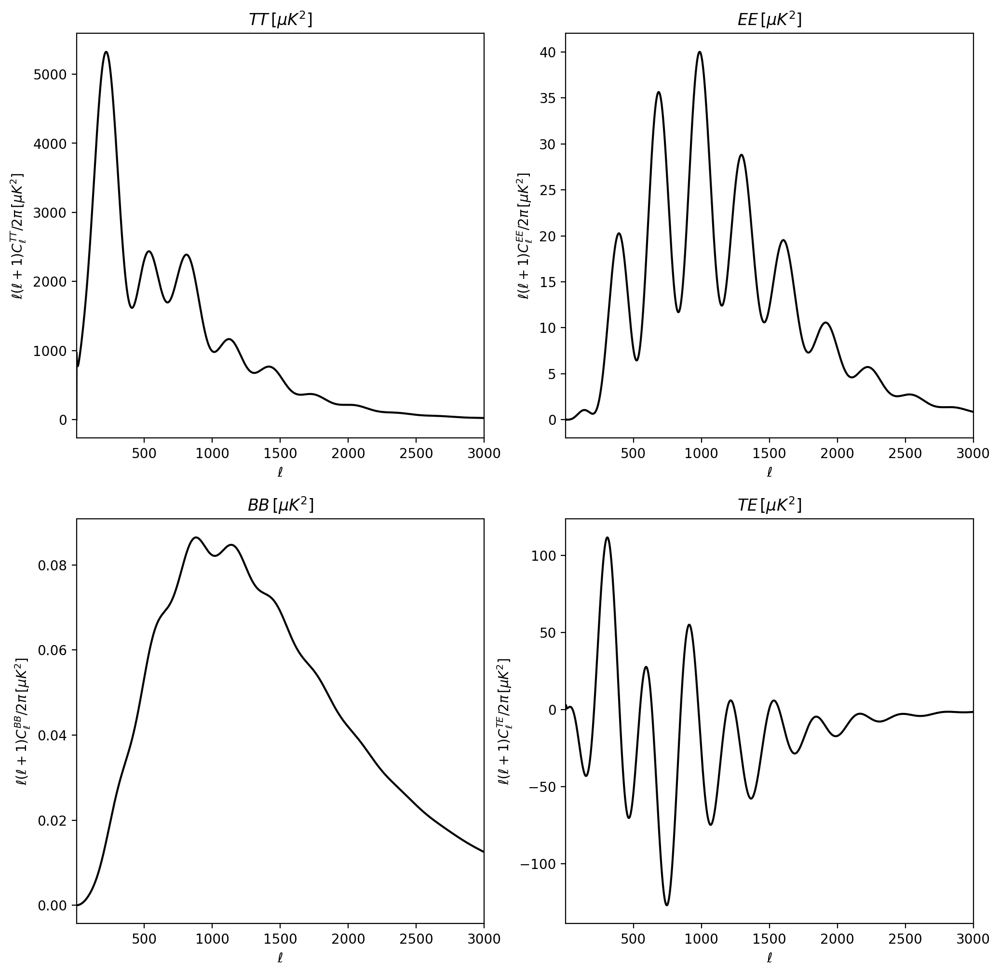

In [85]:
#plot l(l+1)Cl/2pi vs l

fig, ax = plt.subplots(2,2, figsize = (12,12))
names = ['TT', 'EE', 'BB', 'TE']
for i in range(totCL.shape[1]):
    ax[i//2,i%2].plot(ls,totCL[:,i], color='k')
    # ax[i//2,i%2].plot(ls,unlensedCL[:,i], color='C2')
    ax[i//2,i%2].set_title(r'$%s\, [\mu K^2]$'%names[i])
    ax[i//2,i%2].set_xlim([2,3000])
    ax[i//2,i%2].set_xlabel(r'$\ell$')
    ax[i//2,i%2].set_ylabel(rf'$\ell(\ell+1)C_\ell^{{{names[i]}}} /2\pi\,[\mu  K^2]$')

/tmp/ipykernel_31525/969156436.py:5: RuntimeWarning: invalid value encountered in divide
  ax[i//2,i%2].plot(ls,totCL[:,i]/ls/(ls+1), color='k')


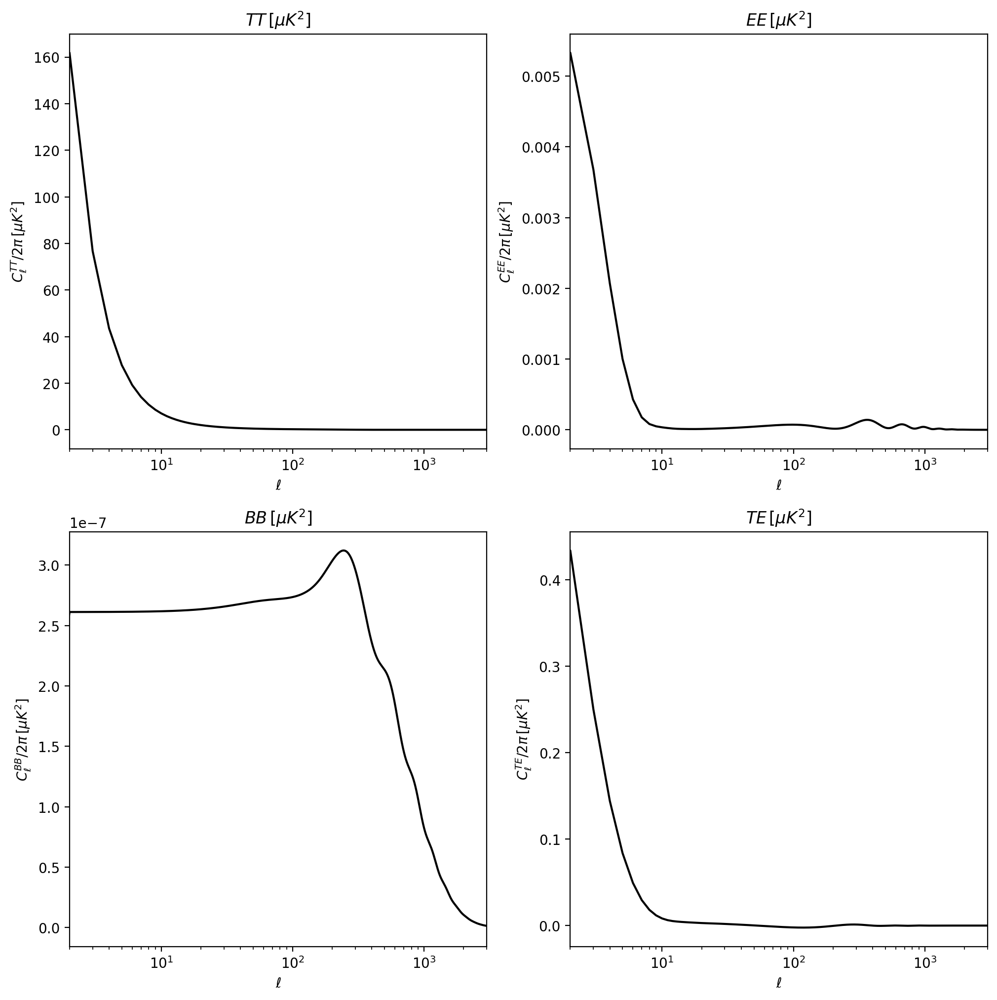

In [86]:
#divide totCL by l(l+1) and plot them:

fig, ax = plt.subplots(2,2, figsize = (12,12))
for i in range(totCL.shape[1]):
    ax[i//2,i%2].plot(ls,totCL[:,i]/ls/(ls+1), color='k')
    # ax[i//2,i%2].plot(ls,unlensedCL[:,i]/ls/(ls+1), color='C2')
    ax[i//2,i%2].set_title(r'$%s\, [\mu K^2]$'%names[i])
    ax[i//2,i%2].set_xlim([2,3000])
    ax[i//2,i%2].set_xlabel(r'$\ell$')
    ax[i//2,i%2].set_ylabel(rf'$C_\ell^{{{names[i]}}} /2\pi\,[\mu  K^2]$')
    #log scale
    ax[i//2,i%2].set_xscale('log')


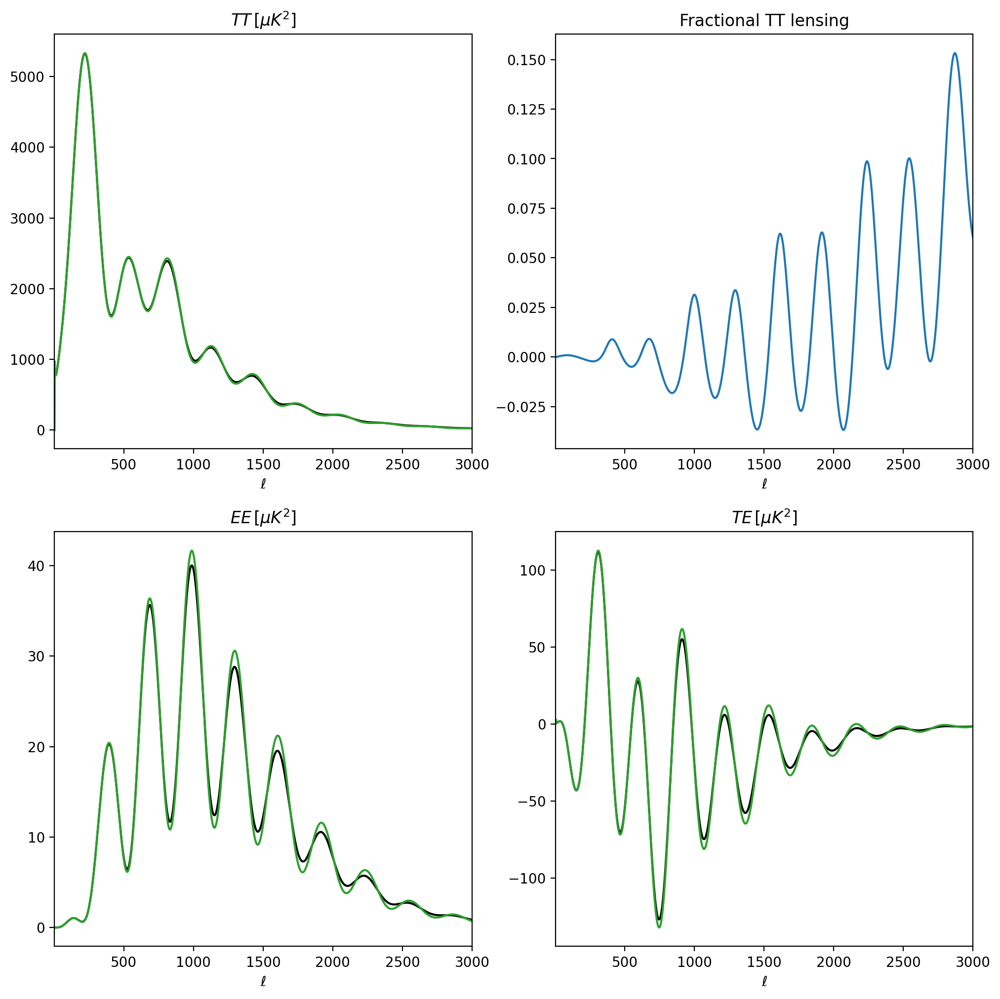

In [87]:
fig, ax = plt.subplots(2,2, figsize = (12,12))
ax[0,0].plot(ls,totCL[:,0], color='k')
ax[0,0].plot(ls,unlensedCL[:,0], color='C2')
ax[0,0].set_title(r'$TT\, [\mu K^2]$')
ax[0,1].plot(ls[2:], 1-unlensedCL[2:,0]/totCL[2:,0]);
ax[0,1].set_title(r'Fractional TT lensing')
ax[1,0].plot(ls,totCL[:,1], color='k')
ax[1,0].plot(ls,unlensedCL[:,1], color='C2')
ax[1,0].set_title(r'$EE\, [\mu K^2]$')
ax[1,1].plot(ls,totCL[:,3], color='k')
ax[1,1].plot(ls,unlensedCL[:,3], color='C2')
ax[1,1].set_title(r'$TE\, [\mu K^2]$');
for ax in ax.reshape(-1):
    ax.set_xlim([2,3000])
    ax.set_xlabel(r'$\ell$');

#### Ejercicio 2.2:

Variar los parámetros cosmológicos (de a uno por vez) en un 5% respecto del valor fiducial elegido en el ejercicio 2.1, y volver a graficar los espectros.
Varíe $H_0$, $\Omega_b$, $\Omega_c$, $A_s$, $n_s$.
Cómo se modifica el aspecto de las curvas? Puede entender, al menos intuitivamente por qué se produce dicho cambio?

In [88]:
#see all pars atributes:
print(dir(pars))
pars_atr= dir(pars)
print(len(pars_atr))
pars.Want_CMB

['Accuracy', 'Alens', 'CustomSources', 'DarkEnergy', 'Do21cm', 'DoLateRadTruncation', 'DoLensing', 'Evolve_baryon_cs', 'Evolve_delta_Ts', 'Evolve_delta_xe', 'H0', 'InitPower', 'InitialConditionVector', 'Log_lvalues', 'MassiveNuMethod', 'N_eff', 'NonLinear', 'NonLinearModel', 'OutputNormalization', 'Recomb', 'Reion', 'SourceTerms', 'SourceWindows', 'TCMB', 'Transfer', 'WantCls', 'WantDerivedParameters', 'WantScalars', 'WantTensors', 'WantTransfer', 'WantVectors', 'Want_CMB', 'Want_CMB_lensing', 'Want_cl_2D_array', 'YHe', '_DarkEnergy', '_Do21cm', '_DoLateRadTruncation', '_DoLensing', '_Evolve_baryon_cs', '_Evolve_delta_Ts', '_Evolve_delta_xe', '_InitPower', '_InitialConditionVector', '_Log_lvalues', '_MassiveNuMethod', '_NonLinear', '_NonLinearModel', '_Recomb', '_Reion', '_SourceWindows', '_WantCls', '_WantDerivedParameters', '_WantScalars', '_WantTensors', '_WantTransfer', '_WantVectors', '_Want_CMB', '_Want_CMB_lensing', '_Want_cl_2D_array', '__annotations__', '__class__', '__copy__'

True

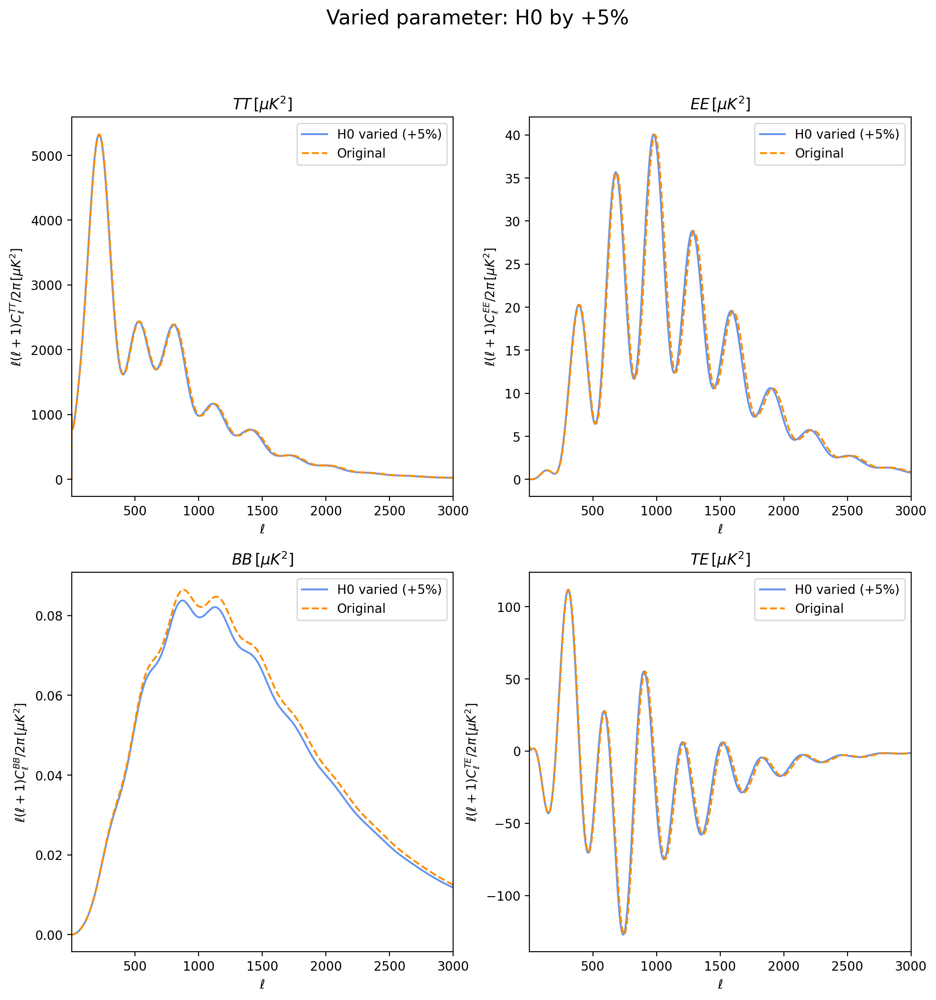

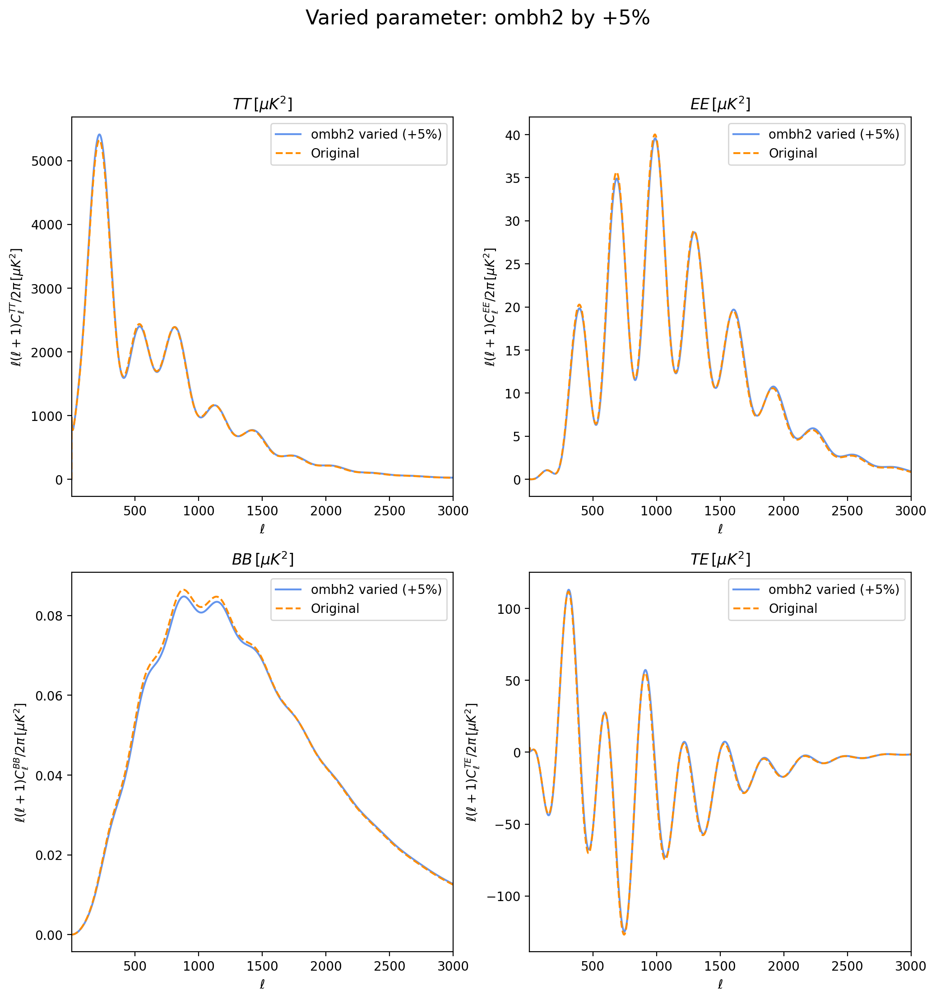

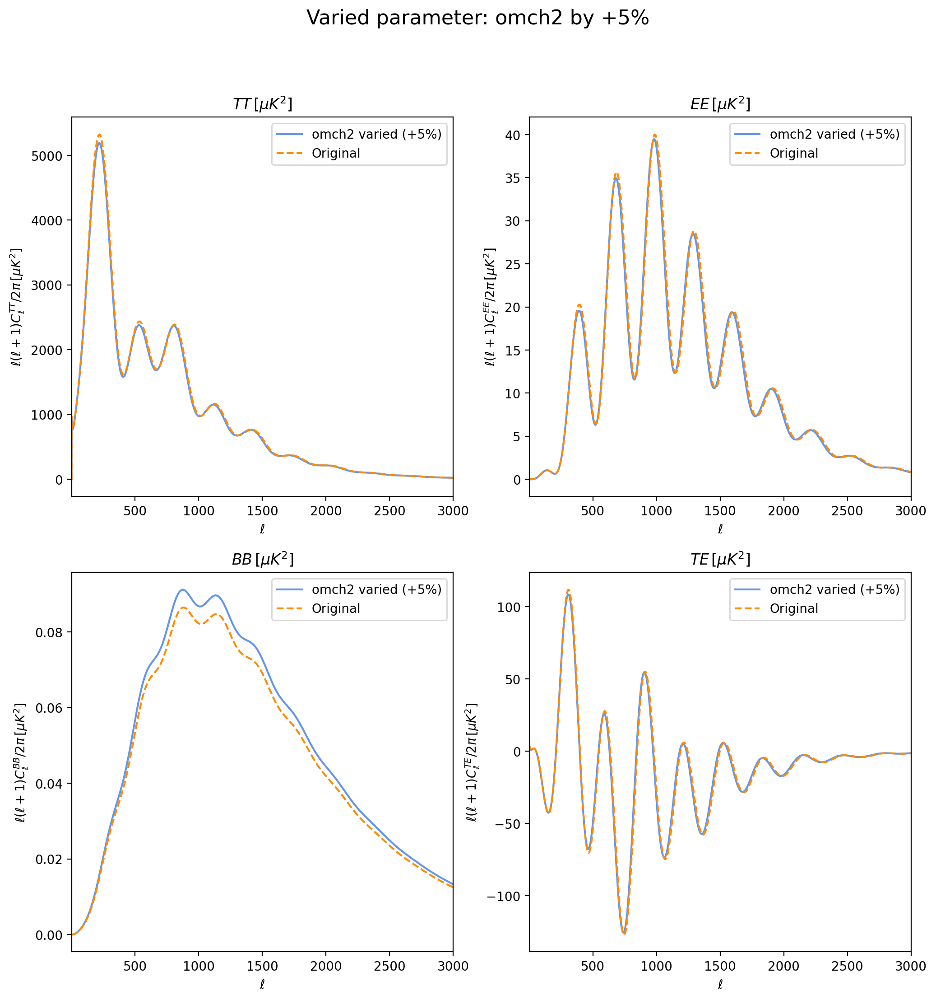

Parameter 'As' not found or could not be updated.


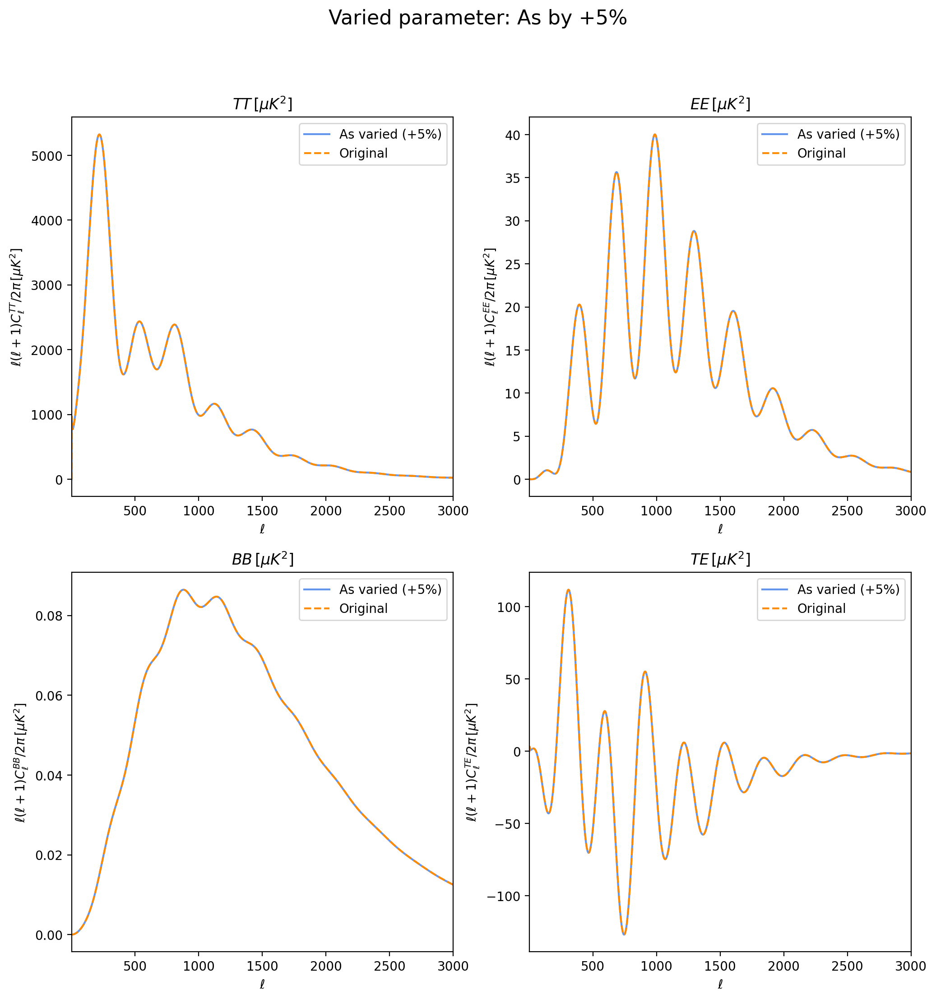

Parameter 'ns' not found or could not be updated.


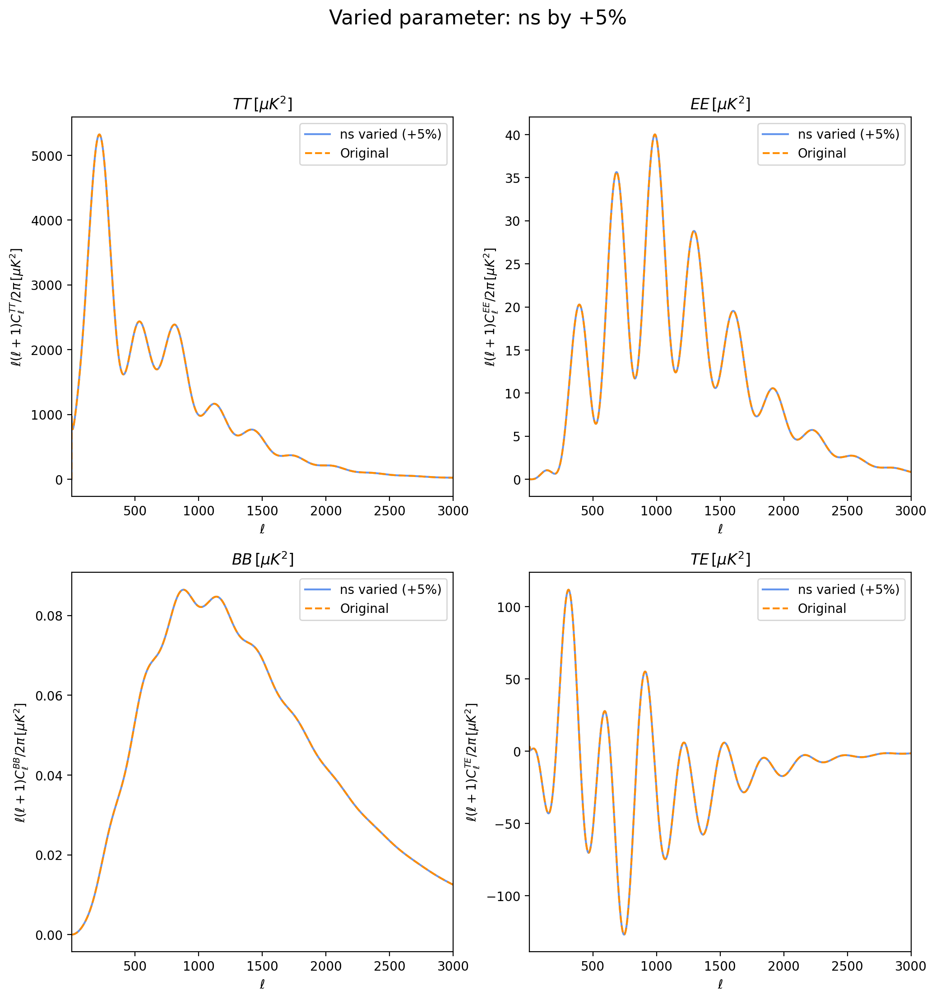

In [89]:
# Original parameters
pars = camb.CAMBparams()
pars.set_cosmology(H0=67.5, ombh2=0.022, omch2=0.122, mnu=0.06, omk=0, tau=0.06)
pars.InitPower.set_params(As=2e-9, ns=0.965)
pars.set_for_lmax(lmax=3000)

results = camb.get_results(pars)
powers = results.get_cmb_power_spectra(pars, CMB_unit='muK')
original_totCL = powers['total']

# Parameters to vary
pars_to_vary = ['H0', 'ombh2', 'omch2', 'As', 'ns']
original_pars = [67.5, 0.022, 0.122, 2e-9, 0.965]

for i, par in enumerate(pars_to_vary):
    new_pars = pars.copy()

    #itero para agregar 5%+-
    if par in pars_to_vary:
        current_value = getattr(new_pars, par, None)
        if current_value is not None:  #si existe el param:
            setattr(new_pars, par, current_value * 1.05)  # agrega 5%
        else:
            print(f"Parameter '{par}' not found or could not be updated.")

    else:
        print(f"Unsupported parameter: {par}")
        continue

    #compute resultados
    results = camb.get_results(new_pars)
    powers = results.get_cmb_power_spectra(new_pars, CMB_unit='muK')
    totCL = powers['total']

    # Plot the C_ls
    ls = np.arange(totCL.shape[0])
    fig, ax = plt.subplots(2, 2, figsize=(12, 12))
    names = ['TT', 'EE', 'BB', 'TE']
    for j in range(totCL.shape[1]):
        ax[j // 2, j % 2].plot(ls, totCL[:, j], color='cornflowerblue',  label=f'{par} varied (+5%)')
        ax[j // 2, j % 2].plot(ls, original_totCL[:, j], color='darkorange', linestyle='--', label='Original')
        ax[j // 2, j % 2].set_title(r'$%s\, [\mu K^2]$' % names[j])
        ax[j // 2, j % 2].set_xlim([2, 3000])
        ax[j // 2, j % 2].set_xlabel(r'$\ell$')
        ax[j // 2, j % 2].set_ylabel(rf'$\ell(\ell+1)C_\ell^{{{names[j]}}} /2\pi\,[\mu  K^2]$')
        ax[j // 2, j % 2].legend()

    #title para cada parámetro variado
    fig.suptitle(f'Varied parameter: {par} by +5%', fontsize=16)
    plt.show()

#### Ejercicio 3.a:

Utilizando CAMB, crear una realización de mapas de CMB. Guarde el "seed" para poder reproducir la realización.


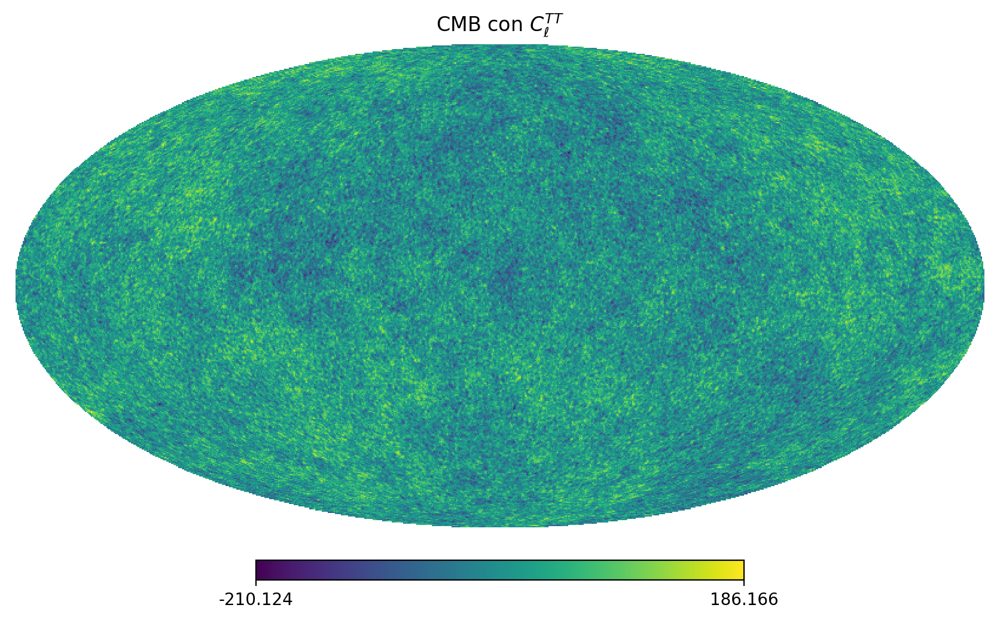

In [90]:
seed = 42
np.random.seed(seed)
NSIDE= 64
cl_TT= totCL[1:,0]/ls[1:] /(ls[1:]+1)
cl_EE= totCL[1:,1]/ls[1:] /(ls[1:]+1)
cl_BB= totCL[1:,2]/ls[1:] /(ls[1:]+1)
cl_TE= totCL[1:,3]/ls[1:] /(ls[1:]+1)
NPIX= 12*NSIDE
cmb_map = hp.synfast(cl_TT, nside= NPIX, pol=True, new=True)
hp.mollview(cmb_map, title=r"CMB con $C_{\ell}^{TT}$")

#### Ejercicio 3.b:

Guarde los $a_{\ell m}$ del mapa anterior, e intente crear un mapa a partir de estos $a_{\ell m}$, eligiendo los FWHM (ancho) del beam del instrumento hipotético con el que observamos el cielo.

Cual fue el FWHM de COBE, WMAP y Planck? (Elija alguna frecuencia típica para dar la respuesta, y pueden ser valores aproximados). Lo importante es distinguir de que orden de magnitud estamos hablando y comparar la resolución angular de las 3 misiones espaciales dedicadas a medir el CMB.

In [91]:
#save a_lm:
lmax=1024
a_lm = hp.map2alm(cmb_map, lmax=lmax)
ell=np.arange(lmax+1)

save_path = 'a_lm.npy'
np.save(save_path, a_lm.astype(np.complex64))

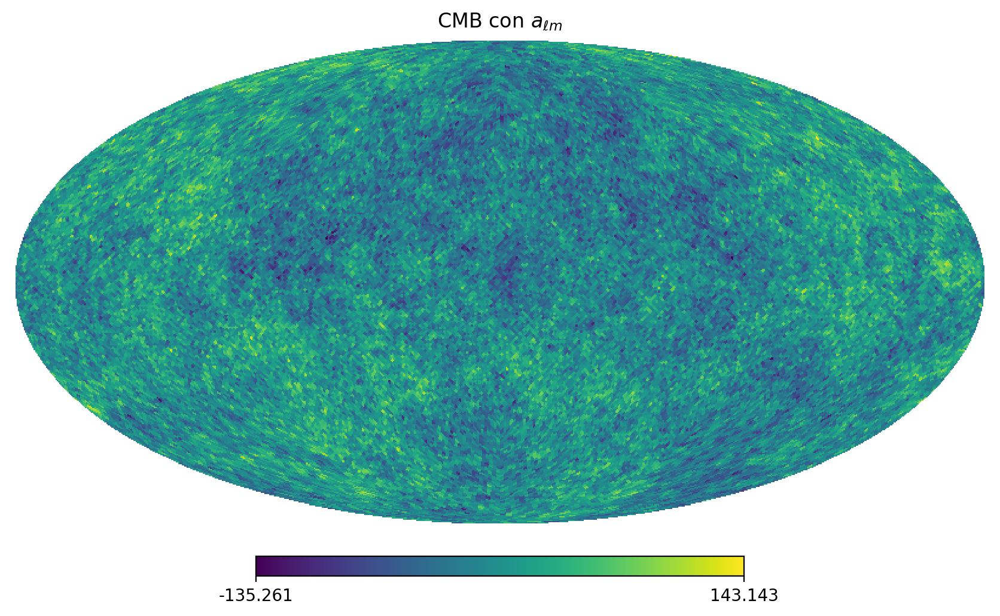

In [92]:
seed=np.random.seed(seed)
#create map with a_lm:
a_lm = np.load(save_path)
#precision of the instrument:
radians= np.radians(0.5)
cmb_map_alm= hp.alm2map(a_lm, nside=NSIDE, lmax=lmax, fwhm= radians)
hp.mollview(cmb_map_alm, title=r"CMB con $a_{\ell m}$")

/tmp/ipykernel_31525/1641495687.py:13: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  cmb_map_smoothed = hp.smoothing(cmb_map, fwhm=fwhm_rad, verbose=False)


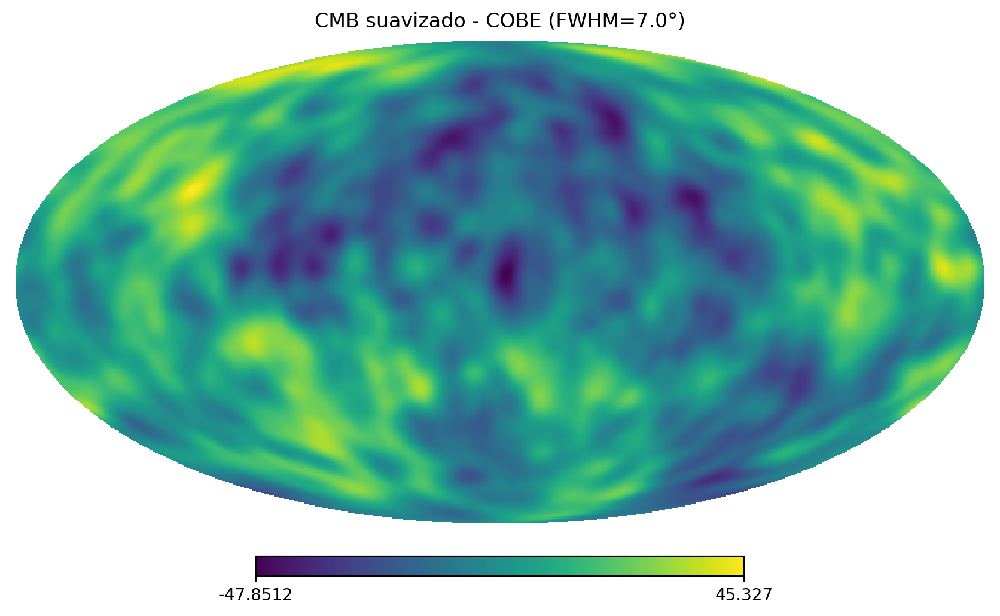

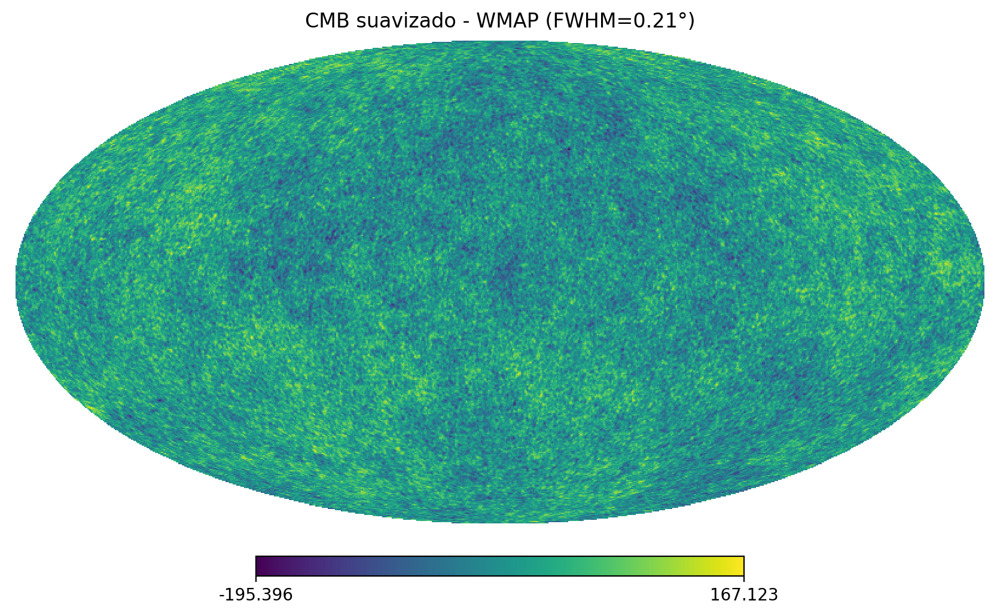

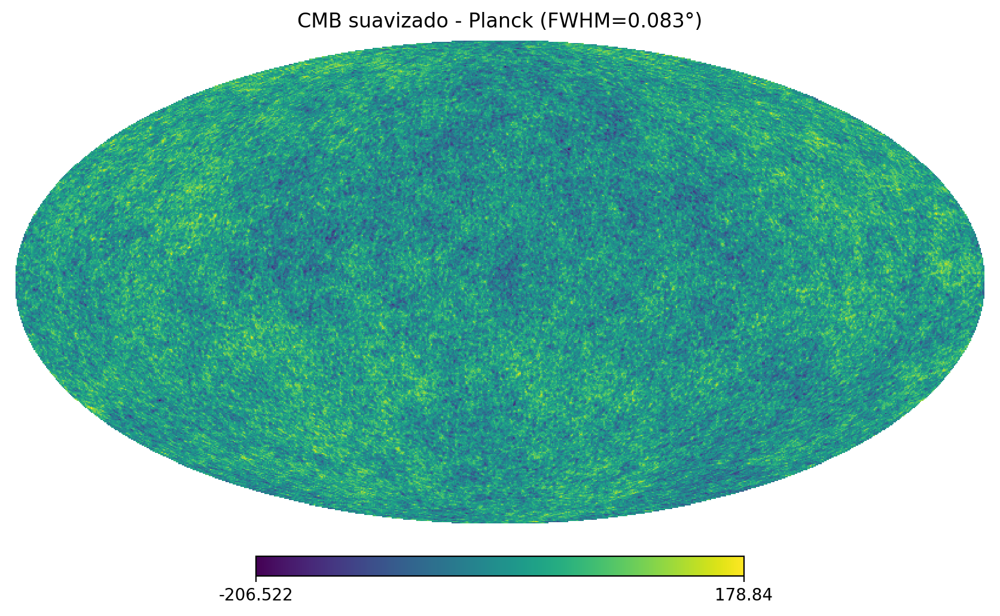

In [93]:
#comparacion de cmbs con cobe, wmap y planck:

# FWHM para cada misión 
fwhm_dict = {
    "COBE": 7.0,      # ~7 grados (COBE DMR)
    "WMAP": 0.21,     # ~12.6 minutos de arco (banda W, 94 GHz)
    "Planck": 0.083   # ~5 minutos de arco (banda 143 GHz)
}


for mission, fwhm_deg in fwhm_dict.items():
    fwhm_rad = np.radians(fwhm_deg)
    cmb_map_smoothed = hp.smoothing(cmb_map, fwhm=fwhm_rad, verbose=False)
    hp.mollview(cmb_map_smoothed, title=f"CMB suavizado - {mission} (FWHM={fwhm_deg}°)")
    plt.show()


#### Ejercicio 4:

Vuelva a crear la misma realización de mapas de CMB, pero esta vez, con un beam distinto de cero, simulando el efecto de la PSF (point spread function) de un telescopio.

Repita con un FWHM más grande.



/tmp/ipykernel_31525/428041778.py:5: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  cmb_map = hp.synfast(cls=cl_TT, nside=npix, lmax=lmax, verbose=False)


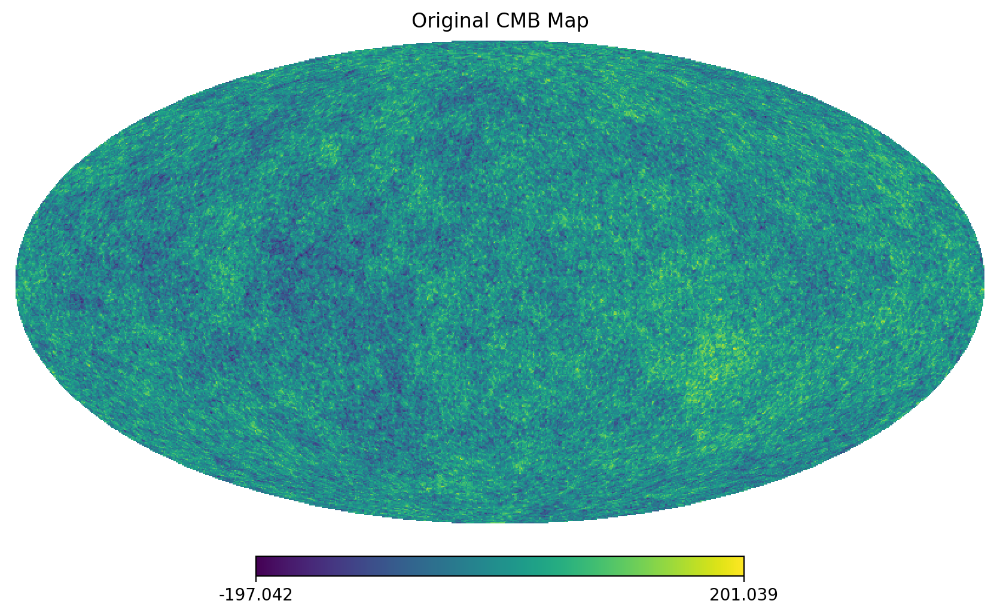

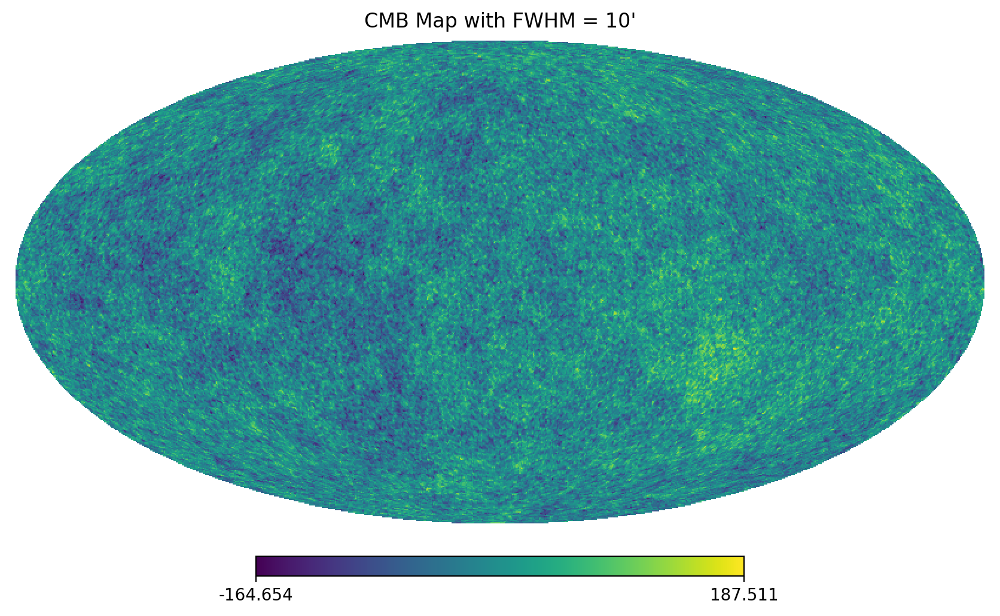

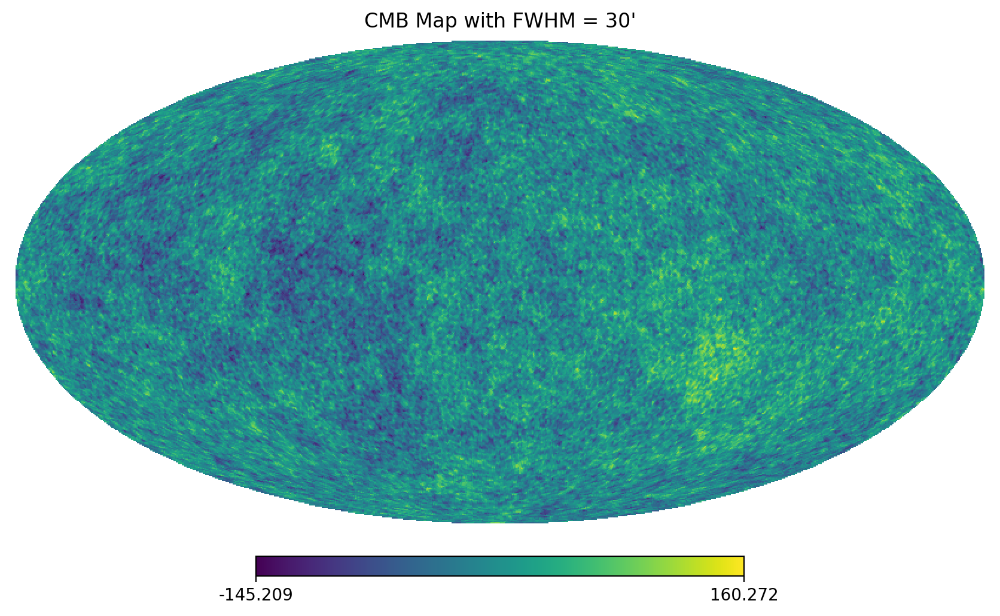

In [94]:
nside = 12
npix= 12*nside
lmax = 1024
cl_TT = totCL[1:, 0] / ls[1:] / (ls[1:] + 1)
cmb_map = hp.synfast(cls=cl_TT, nside=npix, lmax=lmax, verbose=False)

fwhm_small = np.radians(10 / 60)  # 10 arcominuts
cmb_map_smoothed_small = hp.smoothing(cmb_map, fwhm=fwhm_small)

fwhm_large = np.radians(30 / 60)  # 30 arcominutos
cmb_map_smoothed_large = hp.smoothing(cmb_map, fwhm=fwhm_large)

hp.mollview(cmb_map, title="Original CMB Map")
hp.mollview(cmb_map_smoothed_small, title="CMB Map with FWHM = 10'")
hp.mollview(cmb_map_smoothed_large, title="CMB Map with FWHM = 30'")
plt.show()

#### Ejercicio 5:

Calcular el espectro a partir del mapa, tanto en el caso de FWHM = 0, como en el caso distinto de cero. En este último caso, aplicar la corrección por beam.

In [95]:
def cl2dl(cl, lmax=1024):
  ls= np.arange(lmax+1)
  dl= ls*(ls+1)*cl[:lmax+1]/(2*np.pi)
  return dl

In [96]:
print(np.arange(len(cl_TT)))

[   0    1    2 ... 3047 3048 3049]


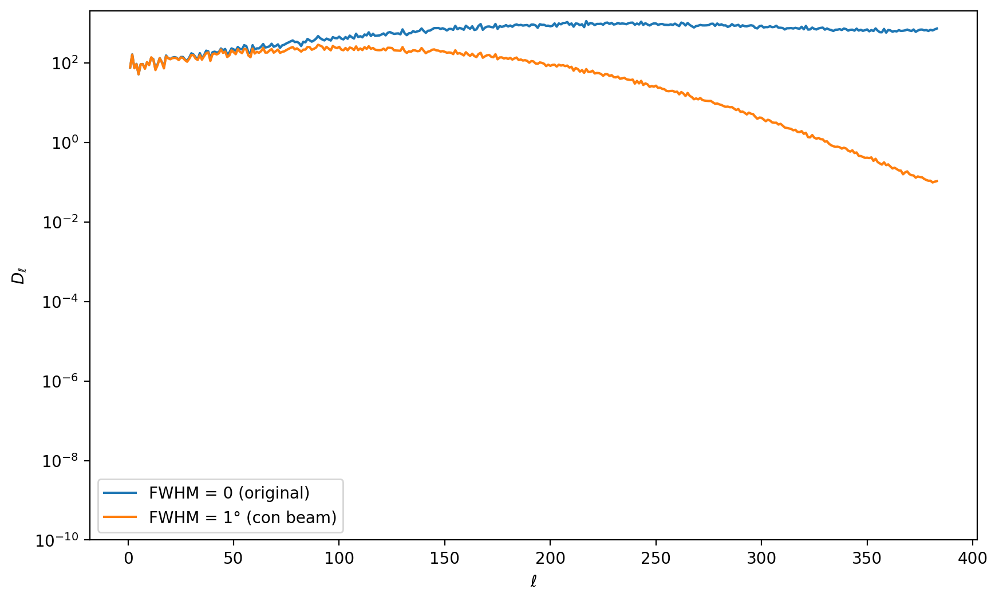

In [97]:
#los alm son los del ejercicio anterior. aseguro que sean complex y con muchos bits asignados
#calculo los Cl's y los paso a Dl's
a_lm_complex = a_lm.astype(np.complex128)
nside = 128
map_no_beam = hp.alm2map(a_lm_complex, nside=nside, fwhm=0)
cl_no_beam = hp.anafast(map_no_beam)
dl_no_beam= cl2dl(cl_no_beam, lmax= len(cl_no_beam)-1)
grados = 1
fwhm = np.radians(grados)
map_beam = hp.alm2map(a_lm_complex, nside=nside, fwhm=fwhm)
cl_beam = hp.anafast(map_beam)
dl_beam= cl2dl(cl_beam, lmax= len(cl_no_beam)-1)

#plot
ls = np.arange(len(cl_no_beam))
plt.figure(figsize=(10, 6))
plt.plot(ls[1:], dl_no_beam[1:], label="FWHM = 0 (original)")
plt.plot(ls[1:], dl_beam[1:], label=f"FWHM = {grados}° (con beam)")
plt.xlabel(r"$\ell$")
plt.ylabel(r"$D_\ell$")
plt.ylim(1e-10, 2000)
plt.yscale("log")
plt.legend()
plt.show()

#### Ejercicio 6:

Explore los otros tutoriales de healpy para crear una máscara, eligiendo cierta región del cielo.

/tmp/ipykernel_31525/1108479700.py:10: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  cmb_map2 = hp.synfast(cls=cl_TT, nside=nside, lmax=lmax, verbose=False)


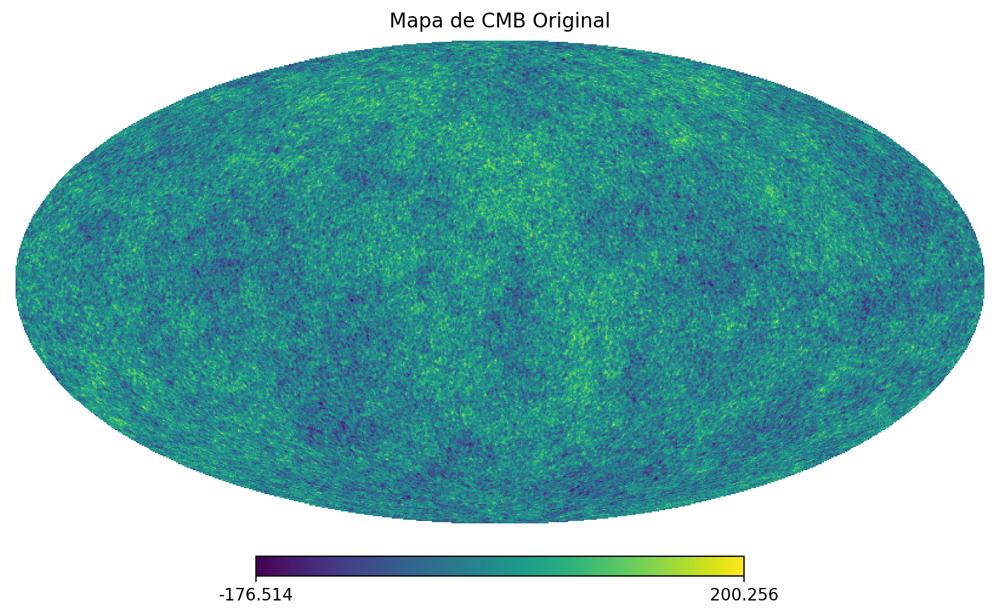

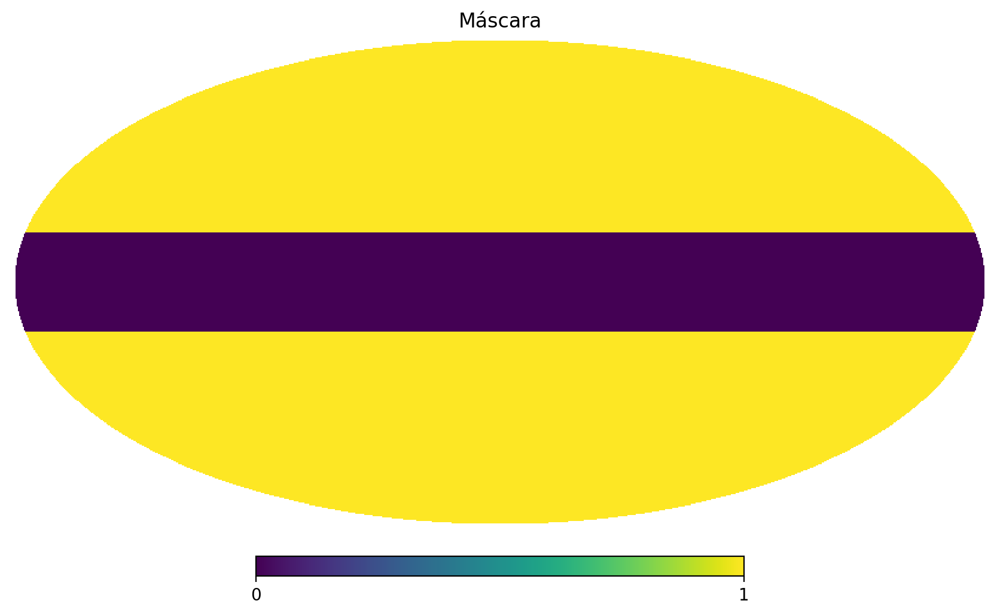

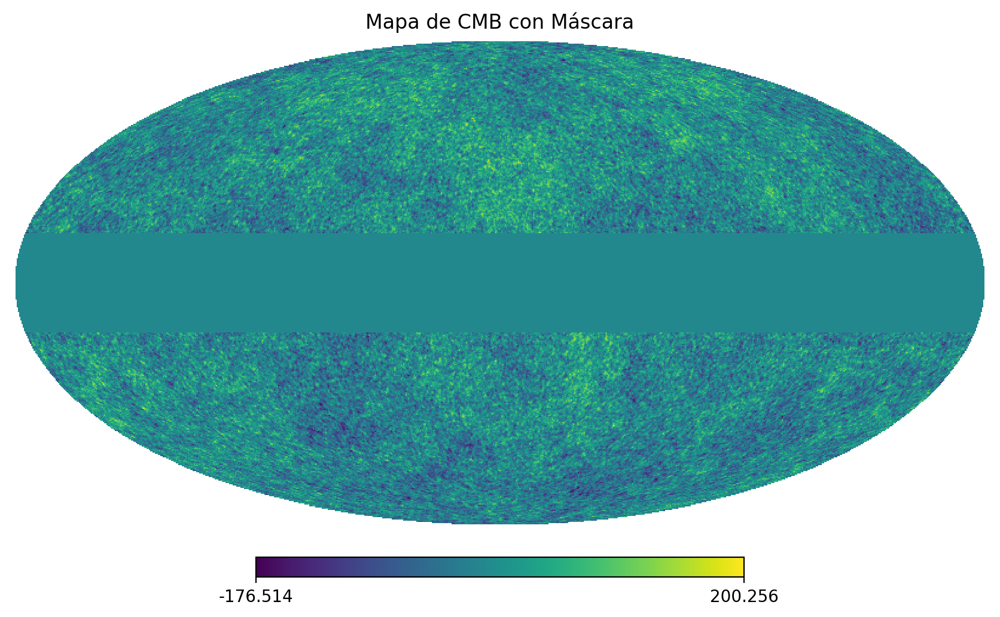

In [98]:
powers = results.get_cmb_power_spectra(pars, CMB_unit='muK')
totCL=powers['total']
ls = np.arange(totCL.shape[0])
cl_TT = totCL[1:, 0] / ls[1:] / (ls[1:] + 1)
nside = 512
lmax = ls[-1]
npix = hp.nside2npix(nside)

#generate map
cmb_map2 = hp.synfast(cls=cl_TT, nside=nside, lmax=lmax, verbose=False)

#create mask
theta, phi = hp.pix2ang(nside=nside, ipix=np.arange(npix))
b_gal = np.degrees(np.pi / 2 - theta)
mask = np.where(np.abs(b_gal) > 15, 1, 0)

masked_cmb_map = cmb_map2 * mask

hp.mollview(cmb_map2, title="Mapa de CMB Original")
hp.mollview(mask, title="Máscara")
hp.mollview(masked_cmb_map, title="Mapa de CMB con Máscara")
plt.show()

#### Ejercicio 7:

Aplique esa máscara al mapa de cielo del CMB que haya creado, y calcule el espectro de potencia. Describa las diferencias con el espectro de entrada. Cómo y en qué medida puede corregir el espectro con las herramientas vistas hasta ahora?

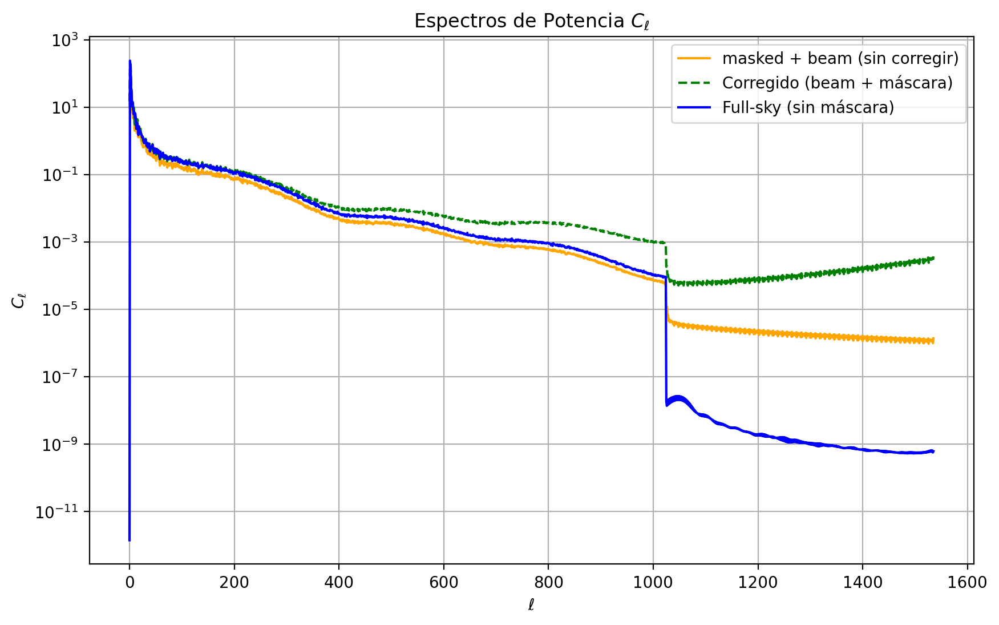

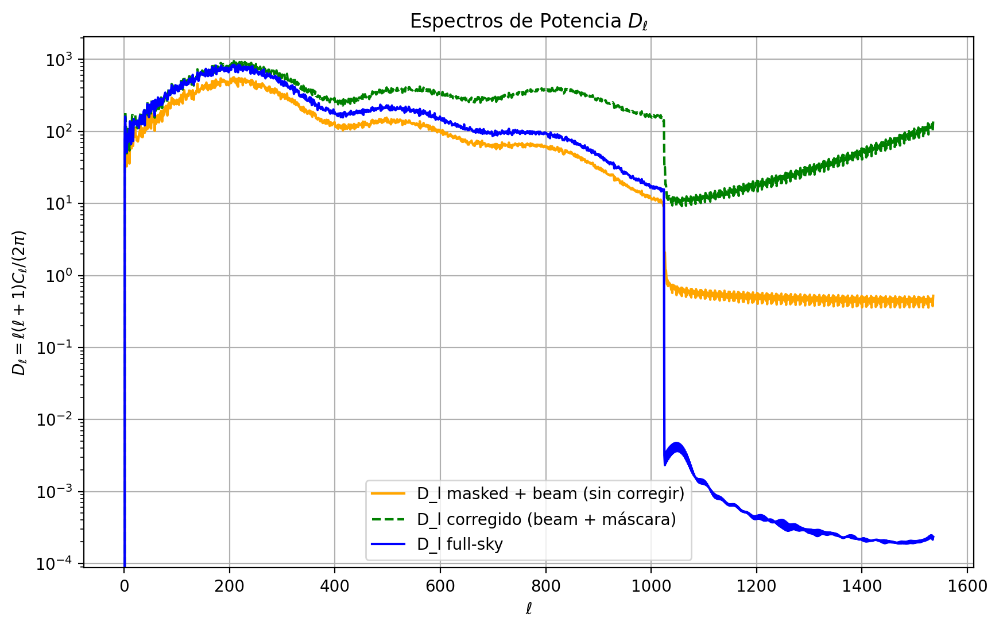

In [99]:
a_lm = np.load("a_lm.npy")
nside = 512
fwhm_val = np.radians(0.2)

cmb_map = hp.alm2map(a_lm, nside=nside, fwhm=fwhm_val)

#angulos de antes
npix = hp.nside2npix(nside)
theta, _ = hp.pix2ang(nside, np.arange(npix))
lat_gal = np.degrees(np.pi/2 - theta)
mask = (np.abs(lat_gal) < 20)
f_sky = np.sum(~mask) / npix
#mascara de antes
cmb_map_masked = hp.ma(cmb_map)
cmb_map_masked.mask = mask

cl_full = hp.anafast(cmb_map)
cl_masked = hp.anafast(cmb_map_masked)

lmax = len(cl_masked) - 1
beam_window = hp.gauss_beam(fwhm_val, lmax=lmax)
cl_corrected = cl_masked / (beam_window**2 * f_sky)

ls = np.arange(len(cl_masked))
plt.figure(figsize=(10,6))
plt.plot(ls, cl_masked, label="masked + beam (sin corregir)", color="orange")
plt.plot(ls, cl_corrected, label="Corregido (beam + máscara)", color="green", linestyle="--")
plt.plot(ls, cl_full, label="Full-sky (sin máscara)", color="blue")
plt.xlabel(r"$\ell$")
plt.ylabel(r"$C_\ell$")
plt.yscale("log")
plt.title("Espectros de Potencia $C_\ell$")
plt.legend()
plt.grid(True)
plt.show()

Dl_masked = ls*(ls+1)*cl_masked / (2*np.pi)
Dl_corrected = ls*(ls+1)*cl_corrected / (2*np.pi)
Dl_full = ls*(ls+1)*cl_full / (2*np.pi)

plt.figure(figsize=(10,6))
plt.plot(ls, Dl_masked, label="D_l masked + beam (sin corregir)", color="orange")
plt.plot(ls, Dl_corrected, label="D_l corregido (beam + máscara)", color="green", linestyle="--")
plt.plot(ls, Dl_full, label="D_l full-sky", color="blue")
plt.xlabel(r"$\ell$")
plt.ylabel(r"$D_\ell = \ell(\ell+1)C_\ell/(2\pi)$")
plt.yscale("log")
plt.title("Espectros de Potencia $D_\ell$")
plt.legend()
plt.grid(True)
plt.show()